# Deep Learning of Binary Hash Codes for Fast Image Retrieval

## Import Packages

In [1]:
import argparse
import cv2
import numpy as np
import random
import os 
import matplotlib.pyplot as plt
import time
import copy
import pickle

from keras.models import Sequential, Model
from keras.layers.core import Flatten, Dense, Dropout
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.optimizers import SGD, Adagrad
from keras.utils import np_utils
from keras import backend as K
from keras.applications import vgg16
from keras.models import model_from_json
from sklearn.preprocessing import normalize

Using TensorFlow backend.


## File paths

In [2]:
index = {}
model_type = "vgg19"
dataset_arg = "101_ObjectCategories/"

model_vgg16_dir = "model_data_vgg16/"
model_vgg19_dir = "model_data_vgg19/"

index_arg_vgg16 = "index.pickle-vgg16-1"
index_fast_arg_vgg16 = "index.pickle-vgg16-1_fast"

index_arg_vgg19 = "index.pickle-vgg19-1"
index_fast_arg_vgg19 = "index.pickle-vgg19-1_fast"


model__vgg16_weights = 'vgg16_weights_tf_dim_ordering_tf_kernels.h5'
model__vgg19_weights = 'vgg19_weights_tf_dim_ordering_tf_kernels.h5'

## Utility functions

In [3]:
def normalize(x):
    return (x-x.min())/(x.max()-x.min())

def display_image(path):
    #print path
    im = cv2.imread(path)
    plt.imshow(im)
    plt.show()

def get_image_path(path):

    images_path = [os.path.join(root, name)
                   for root, dirs, files in os.walk(path)
                   for name in files
                   if name.endswith((".jpg"))]
    return images_path

# 获取所有的图片的相对路径和101个标签
def get_image_labels(path):
    labels = []
    images_label = []
    for dirName, subdirList, fileList in os.walk(path):
        if dirName[-len('101_ObjectCategories/'):]!="101_ObjectCategories/" :
            newDir = dirName.split('/')[-1]
            labels.append(newDir)
    for img_path in images_path:
        
        img_dir = img_path.split('/')[-2]
        images_label.append(labels.index(img_dir))

    return labels, images_label

# 将所有图片的路径打乱并且返回同样顺序的标签
def randomize_data(images_label, images_path):
    #randomize order of data
    rnd_idx = range(len(images_label))
    rnd_idx = random.sample(rnd_idx, len(rnd_idx))

    images_label_t = [images_label[i] for i in rnd_idx]
    images_path_t = [images_path[i] for i in rnd_idx]
    
    return images_label_t, images_path_t

# 根据每一个图片的相对路径的得到四维的numpy数组
def get_image_data(image_path):
    im = cv2.imread(imagePath)
    
    im = cv2.resize(im, (224, 224)).astype(np.float32)
    
    im[:,:,0] -= 103.939
    im[:,:,1] -= 116.779
    im[:,:,2] -= 123.68
    return im

# 将模型框架存储为json文件，权重存储为h5文件
def save_model(model_name):
    if model_type == "vgg16":
        model_dir = model_vgg16_dir
    else:
        model_dir = model_vgg19_dir
    model_json = model.to_json()
    with open(model_dir + model_name + ".json", "w") as json_file:
        json_file.write(model_json)
    
    model.save_weights(model_dir + model_name + ".h5")
    print("Saved {0} model to disk".format(model_name))

# 根据json文件和h5文件获得相应的模型
def load_model(model_name):
    # load json and create model
    if model_type == "vgg16":
        model_dir = model_vgg16_dir
    else:
        model_dir = model_vgg19_dir
    json_file = open(model_dir + model_name + '.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()

    model = model_from_json(loaded_model_json)
    # load weights into new model
    model.load_weights(model_dir + model_name + ".h5")
    print("Loaded model {0} from disk".format(model_name))
    return model
    

def displayImages(query, list_of_files, columns=5):
    number_of_files = len(list_of_files)
    
    plt.figure(figsize=(10,5))
    
    plt.subplot((number_of_files+columns-1) / columns + 1, columns,  1)

    image = cv2.imread(query)
    plt.imshow(image)
    plt.title("query image")
    plt.xticks([])
    plt.yticks([])

    for i in range(number_of_files):
       
        plt.subplot((number_of_files+columns-1) / columns + 1, columns,  i+1+columns)
        image = cv2.imread(list_of_files[i][-1])
        label = str(list_of_files[i][-2])
        #plt.title(label)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
    
    plt.show()



## VGG Neural Net

In [4]:
def VGG(model_type):
    if (model_type == "vgg16"):
        
        model = Sequential()

        # Block 1
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', input_shape=(224,224,3)))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool'))

        # Block 2
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool'))

        # Block 3
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool'))

        # Block 4
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool'))

        # Block 5
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool'))

        model.add(Flatten(name='flatten'))
        model.add(Dense(4096, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(4096, activation='relu', name='fc2'))
        model.add(Dropout(0.5))
        model.add(Dense(1000, activation='softmax', name='predictions'))

        if weights_path:
            model.load_weights(model__vgg16_weights)
    else:
        model = Sequential()

        # Block 1
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', input_shape=(224,224,3)))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool'))

        # Block 2
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool'))

        # Block 3
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv4'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool'))

        # Block 4
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv4'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool'))

        # Block 5
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3'))
        model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv4'))
        model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool'))

        model.add(Flatten(name='flatten'))
        model.add(Dense(4096, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(4096, activation='relu', name='fc2'))
        model.add(Dropout(0.5))
        model.add(Dense(1000, activation='softmax', name='predictions'))
        
        if weights_path:
            model.load_weights(model__vgg19_weights)

    return model

### Load Images and their labels

In [5]:
images_path = get_image_path(dataset_arg)
print ("Total images: ", len(images_path))

labels, images_label = get_image_labels(dataset_arg)
print("-----------------labels-----------------------")
print(len(labels))
print("-----------------images_label-----------------------")
print(len(images_label))
images_label, images_path = randomize_data(images_label, images_path)
print("-----------------example_images_label-----------------------")
print(images_label[2])
print("-----------------example_images_path-----------------------")
print(images_path[2])

Total images:  8677
-----------------labels-----------------------
101
-----------------images_label-----------------------
8677
-----------------example_images_label-----------------------
40
-----------------example_images_path-----------------------
101_ObjectCategories/revolver/image_0029.jpg


In [6]:
# 将随机打乱的图片路径list和标签list组合成dict
map_path_label = {}
for image_path, image_label in zip(images_path, images_label):
    map_path_label[image_path] = image_label
print(map_path_label["101_ObjectCategories/airplanes/image_0323.jpg"])

18


### obtain data matrix from images

In [7]:
#images_data按乱序装载所有的图片numpy数组，images_path_data的每一个元素是相对路径和numpy数组
images_data = []
images_path_data = []

for imagePath in images_path:
    im = get_image_data(image_path)
    images_data.append(im)
    images_path_data.append((imagePath, im))
print("--------------------------------images_data------------------------")
print(images_data[1].shape)
print("--------------------------------images_path_data------------------------")
print(images_path_data[1][1].shape)

--------------------------------images_data------------------------
(224, 224, 3)
--------------------------------images_path_data------------------------
(224, 224, 3)


## Binary Hash Deep Learning Model

In [8]:
build_model = False
if build_model == True:
    model = VGG(model_type)
    model.summary()

    # Modify model
    hash_layer_size = 8
    no_of_classes = len(labels)

    no_layers_to_pop = 1
    for i in range(no_layers_to_pop):
        model.pop()


    model.add(Dense(hash_layer_size, activation='relu', name="hash_layer"))
    model.add(Dropout(0.2))
    model.add(Dense(no_of_classes, activation='softmax', name="predictions"))

    for layer in model.layers[:-3]:
        layer.trainable = False
        
    model.summary()
    optimizer = SGD(lr=1e-4, momentum=0.9)
    #optimizer = Adagrad(lr=0.01, epsilon=1e-08, decay=0.0)

    model.compile(loss = "binary_crossentropy", optimizer = optimizer, metrics = ['accuracy'])



### Training of Neural Net

In [9]:
train_net = False

if train_net == True:
    X_train = np.array(images_data)
    y_train = np_utils.to_categorical(images_label,len(labels))
    print(X_train.shape)
    print(y_train.shape)
    model.fit(X_train, y_train, batch_size=32, epochs=3, verbose=1)

### Save models and their weights

In [10]:
save_models = False

if save_models == True:
    save_model("model_orig")

    ## two layers removed for obtaining binary hash layer output
    model.pop()
    model.pop()
    save_model("model_pop2")

    ## two layers removed for obtaining feature layer output
    model.pop()
    model.pop()
    save_model("model_pop4")

### Load models

In [11]:
load_model = False
if load_model == True:
    model_orig = load_model("model_pop4")
    model_bh = load_model("model_pop2")
    print(images_path_data[1][1].shape)

### Indexing learned image features

In [12]:
## build feature index
build_index = False

if build_index == True:
    index = {}
    for image_path, image_data in images_path_data:
        im = np.expand_dims(image_data, axis=0)
        pred = model_orig.predict(im)
        pred_bh = model_bh.predict(im)

        index[image_path] = (pred_bh, pred)
        if(len(index.keys())%100)==1:
            print ("Total images done: {0}/{1}".format(len(index.keys()), len(images_path_data)))
            
    print("we are now done indexing our image -- now saving the index to disk...")
    if model_type == "vgg16":
        index_dir = index_arg_vgg16
    else:
        index_dir = index_arg_vgg19
    with open(index_dir, "wb") as f:
        pickle.dump(index, f)
        

In [13]:
## build hash feature index
build_hash_index = False

if build_hash_index == True:
    index_fast = {}
    images_path = index.keys()
    hash_str = lambda x: '1' if x==1 else '0'
    
    for image_path in images_path:
        feature = index[image_path][1]
        qHash = index[image_path][0]
        qHash = normalize(qHash)
        qHash[qHash>=0.5]=1
        qHash[qHash<0.5]=0
        qHash = ''.join([hash_str(i) for i in qHash[0]])
        if qHash in index_fast.keys():
            index_fast[qHash].append((image_path, feature))
        else:
            index_fast[qHash] = [(image_path, feature)]
    print("Total binary hash classes: ", len(index_fast.keys())) 
    print("binary hash classes: ", index_fast.keys())
    print("we are now done indexing our image -- now saving the index to disk...")
    if model_type == "vgg16":
        index_fast_dir = index_fast_arg_vgg16
    else:
        index_fast_dir = index_fast_arg_vgg19
    with open(index_fast_dir, "wb") as f:
        pickle.dump(index_fast, f)
    print("done: Index saved to disk")


### Load index from disk

In [24]:
if model_type == "vgg16":
    arg = index_arg_vgg16
    arg_fast = index_fast_arg_vgg16
else:
    arg = index_arg_vgg19
    arg_fast = index_fast_arg_vgg19
with open(arg, "rb") as f:
    index = pickle.load(f, encoding='latin1')
    
with open(arg_fast, "rb") as f:
    index_fast = pickle.load(f, encoding='latin1')
    
print(len(index))
print(len(index_fast))
print("binary hash classes: ", len(index_fast.keys()))

8677
186
binary hash classes:  186


## Searcher

In [15]:
class Searcher:
    def __init__(self, index, map_path_label, limit=10):
        # store our index path
        self.index = index
        self.limit = limit
        self.map_path_label = map_path_label
        self.hash_str = lambda x: '1' if x==1 else '0'
        
    def chi2_distance(self, histA, histB, eps = 1e-10):
        d = 0.5 * np.sum([((a - b) ** 2) / (a + b + eps)
            for (a, b) in zip(histA, histB)])
        return d
    
    def hamming_distance(self, a, b):
        cnt=0
        for i ,j in zip(a, b):
            if i!=j:
                cnt+=1
        return cnt

    def search(self, image_path, use_hash = False, hamming_distance = 1):
        t1 = time.time()
        if use_hash:
            results, acc = self.search_with_hash(image_path, hamming_distance)
        else:
            results, acc = self.search_without_hash(image_path)
        t2 = time.time()
        time_diff = t2-t1
        
        return (results, time_diff, acc)
    
    def search_with_hash(self, image_path, hamming_distance):
        
        results = {}
        image_data = get_image_data(image_path)
        query_label = self.map_path_label[image_path]
        
        queryFeatures = index[image_path][1]
        queryHash = index[image_path][0]
        
        queryHash = normalize(queryHash)
        queryHash[queryHash>=0.5]=1
        queryHash[queryHash<0.5]=0
        queryHash = ''.join([self.hash_str(i) for i in queryHash[0]])
        for key in self.index.keys():
            if self.hamming_distance(queryHash, key) <= hamming_distance:
                images_path = self.index[key]
                for image_path, feature in images_path:
                    d = self.chi2_distance(feature, queryFeatures)
                    results[image_path] = (key, d)

        results = sorted([(v[1], v[0], k) for (k,v) in results.items()])
        results = results[:self.limit]
        
        acc_score = 0
        for item in results:
            item_label = self.map_path_label[item[2]]
            if item_label==query_label:
                acc_score += 1
                
        acc_score = (acc_score*100.0)/float(self.limit)
        return results, acc_score
    
    def search_without_hash(self, image_path):
        # initialize our dictionary of results
        results = {}
        image_data = get_image_data(image_path)
        query_label = self.map_path_label[image_path]
        
        #queryFeatures = model_orig.predict(image_data)
        queryFeatures = index[image_path][1]
        for key in self.index.keys():
            images_path = self.index[key]
            for image_path, feature in images_path:
                d = self.chi2_distance(feature, queryFeatures)
                results[image_path] = (key, d)
        
        results = sorted([(v[1], v[0], k) for (k,v) in results.items()])
        results = results[:self.limit]
        
        acc_score = 0
        for item in results:
            item_label = self.map_path_label[item[2]]
            if item_label==query_label:
                acc_score += 1
                
        acc_score = (acc_score*100.0)/float(self.limit)
        return results, acc_score


### Query Search Engine

101_ObjectCategories/Motorbikes/image_0406.jpg
results 1 | time taken : 0.2830188274383545 | accuracy: 100.0%


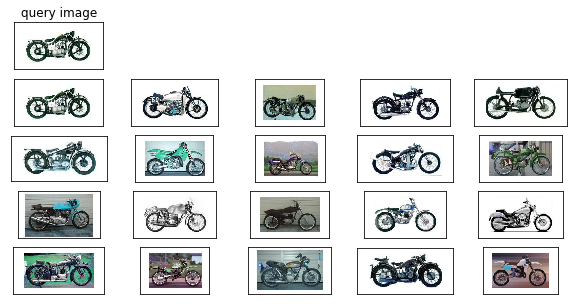

results 2 | time taken : 0.15608978271484375 | accuracy: 100.0%
percentage reduction:  44.8483 %



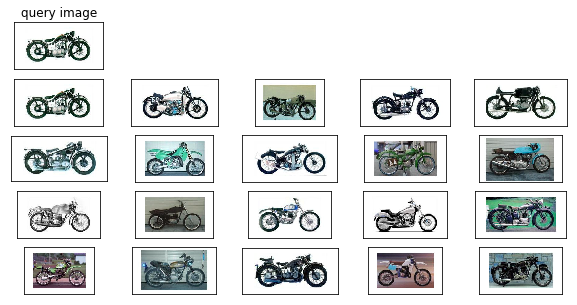

----------------------------------
101_ObjectCategories/accordion/image_0052.jpg
results 1 | time taken : 0.26285314559936523 | accuracy: 95.0%


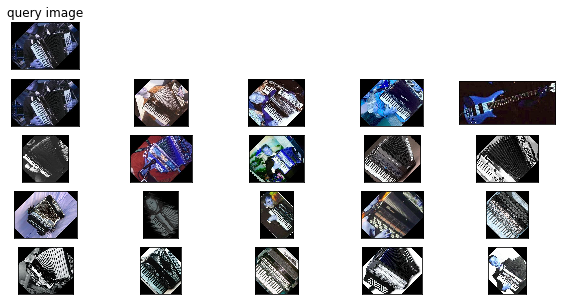

results 2 | time taken : 0.056691884994506836 | accuracy: 95.0%
percentage reduction:  78.4321 %



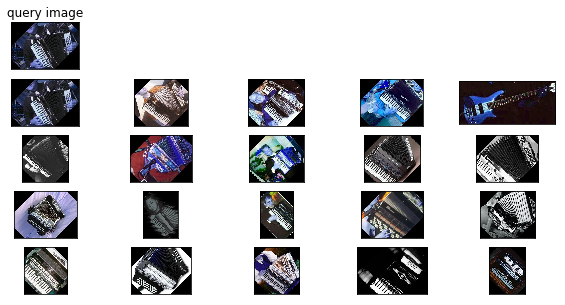

----------------------------------
101_ObjectCategories/Faces/image_0036.jpg
results 1 | time taken : 0.2584359645843506 | accuracy: 80.0%


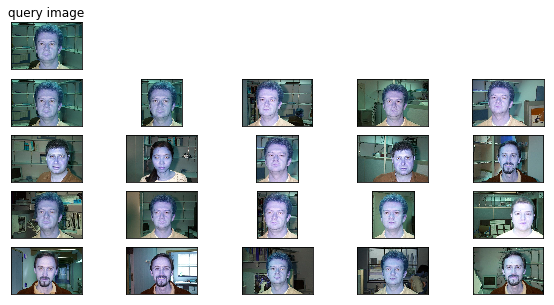

results 2 | time taken : 0.08923602104187012 | accuracy: 80.0%
percentage reduction:  65.4707 %



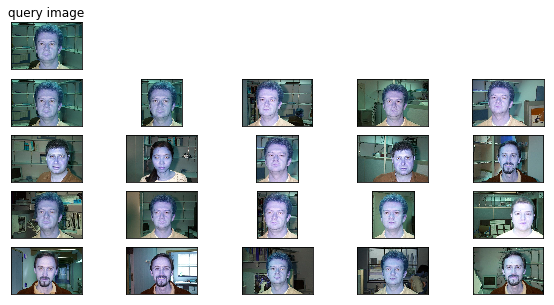

----------------------------------
101_ObjectCategories/Motorbikes/image_0296.jpg
results 1 | time taken : 0.2570171356201172 | accuracy: 100.0%


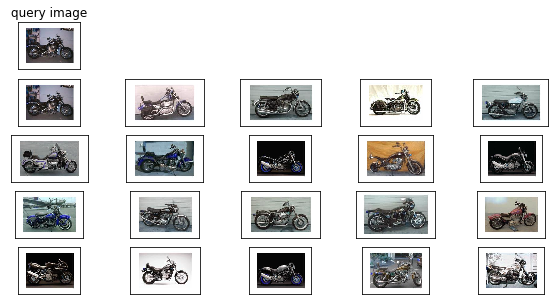

results 2 | time taken : 0.1564619541168213 | accuracy: 100.0%
percentage reduction:  39.1239 %



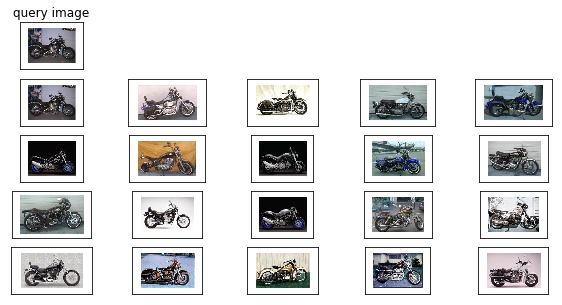

----------------------------------
101_ObjectCategories/schooner/image_0035.jpg
results 1 | time taken : 0.26960086822509766 | accuracy: 25.0%


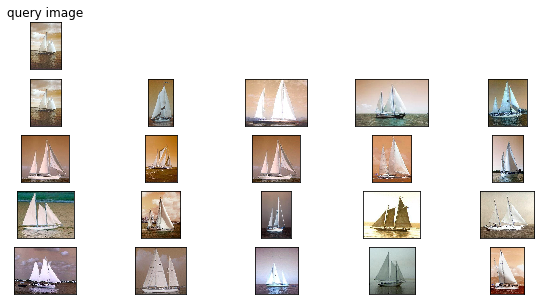

results 2 | time taken : 0.16210627555847168 | accuracy: 25.0%
percentage reduction:  39.8718 %



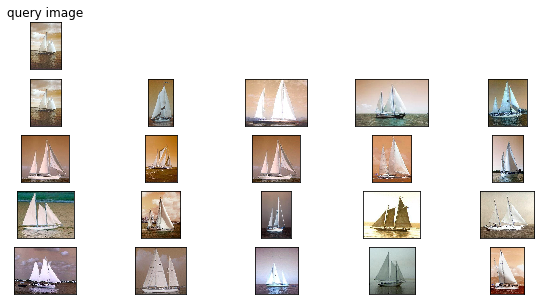

----------------------------------
101_ObjectCategories/trilobite/image_0056.jpg
results 1 | time taken : 0.2902040481567383 | accuracy: 100.0%


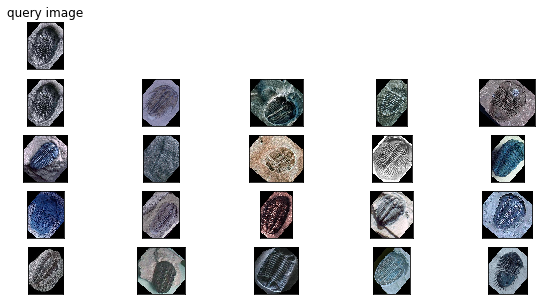

results 2 | time taken : 0.06773185729980469 | accuracy: 100.0%
percentage reduction:  76.6606 %



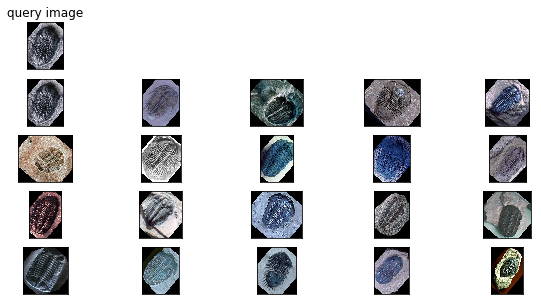

----------------------------------
101_ObjectCategories/kangaroo/image_0072.jpg
results 1 | time taken : 0.28090500831604004 | accuracy: 5.0%


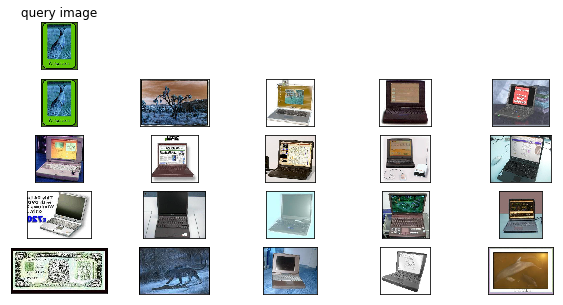

results 2 | time taken : 0.12404727935791016 | accuracy: 5.0%
percentage reduction:  55.8401 %



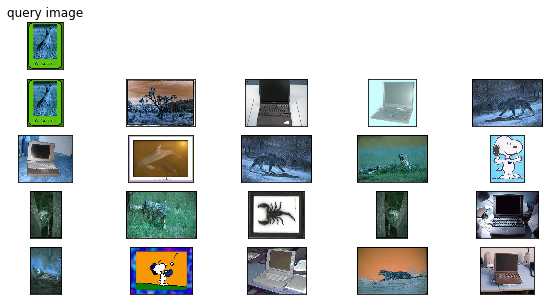

----------------------------------
101_ObjectCategories/crocodile_head/image_0002.jpg
results 1 | time taken : 0.27288103103637695 | accuracy: 100.0%


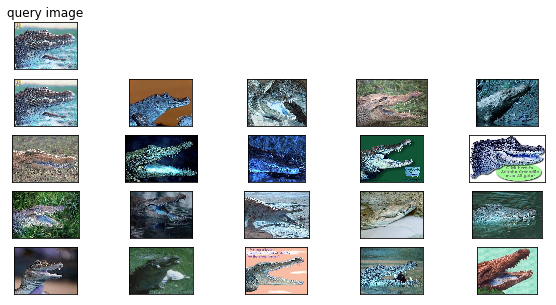

results 2 | time taken : 0.06787991523742676 | accuracy: 85.0%
percentage reduction:  75.1247 %



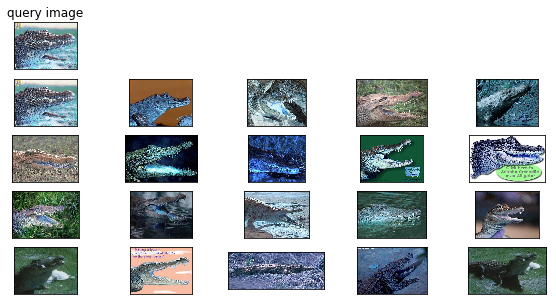

----------------------------------
101_ObjectCategories/mayfly/image_0035.jpg
results 1 | time taken : 0.25760412216186523 | accuracy: 65.0%


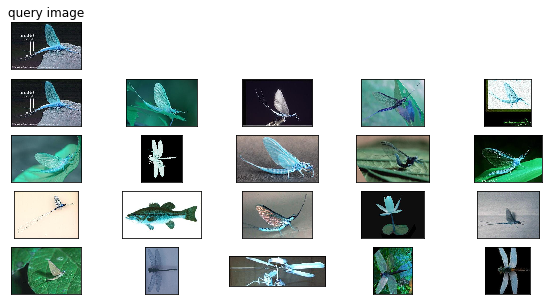

results 2 | time taken : 0.06874418258666992 | accuracy: 60.0%
percentage reduction:  73.314 %



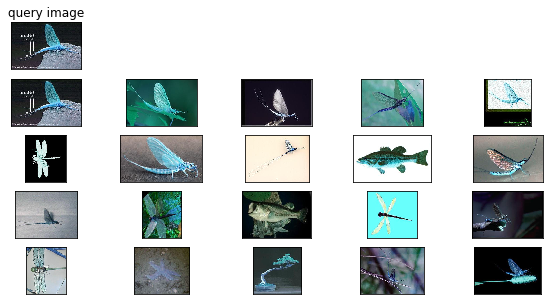

----------------------------------
101_ObjectCategories/chair/image_0059.jpg
results 1 | time taken : 0.26825976371765137 | accuracy: 50.0%


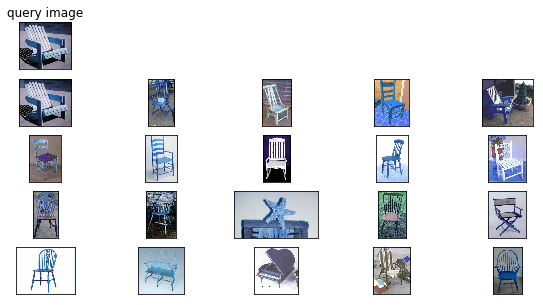

results 2 | time taken : 0.13943886756896973 | accuracy: 50.0%
percentage reduction:  48.021 %



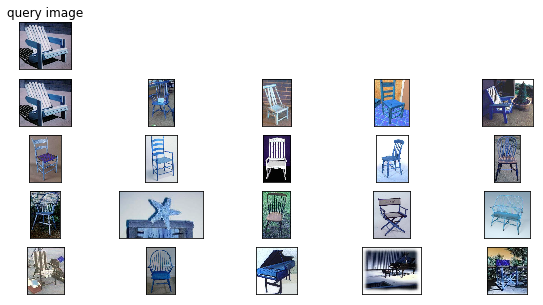

----------------------------------
101_ObjectCategories/schooner/image_0018.jpg
results 1 | time taken : 0.3627142906188965 | accuracy: 85.0%


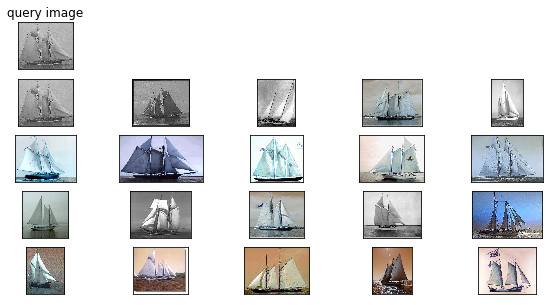

results 2 | time taken : 0.1566309928894043 | accuracy: 85.0%
percentage reduction:  56.817 %



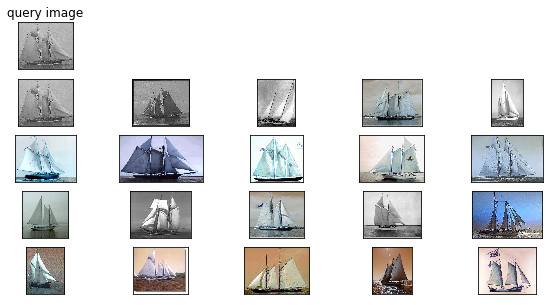

----------------------------------
101_ObjectCategories/airplanes/image_0620.jpg
results 1 | time taken : 0.3444788455963135 | accuracy: 100.0%


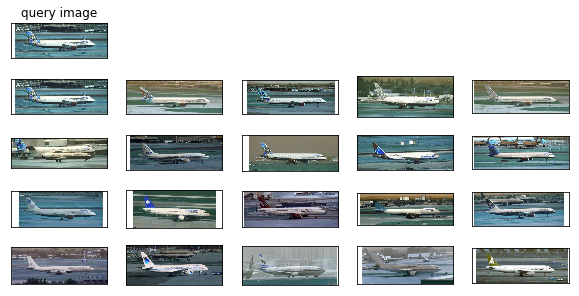

results 2 | time taken : 0.1060190200805664 | accuracy: 100.0%
percentage reduction:  69.2234 %



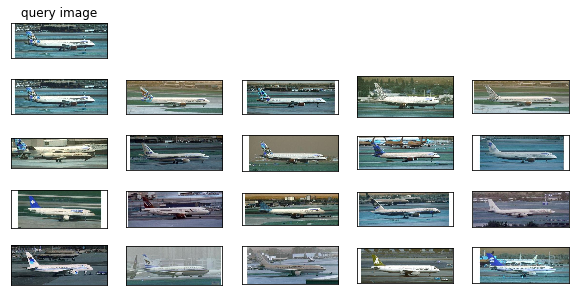

----------------------------------
101_ObjectCategories/Faces_easy/image_0393.jpg
results 1 | time taken : 0.3341031074523926 | accuracy: 90.0%


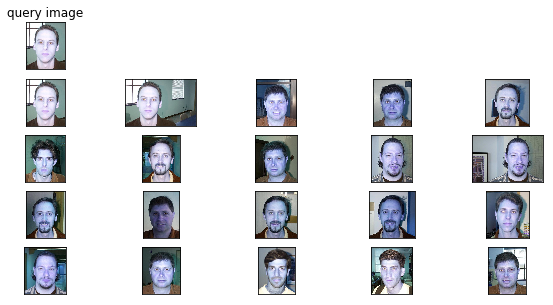

results 2 | time taken : 0.1049652099609375 | accuracy: 90.0%
percentage reduction:  68.583 %



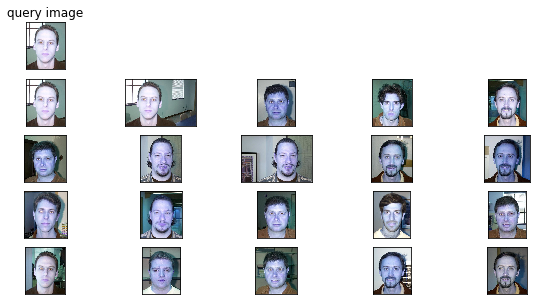

----------------------------------
101_ObjectCategories/ewer/image_0025.jpg
results 1 | time taken : 0.2585599422454834 | accuracy: 90.0%


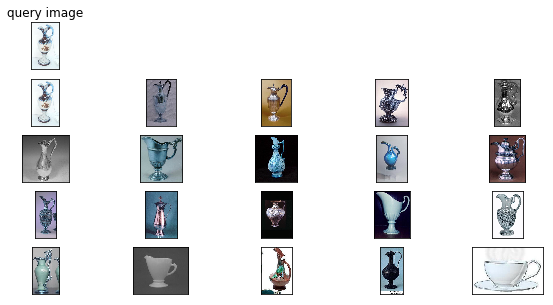

results 2 | time taken : 0.21938490867614746 | accuracy: 90.0%
percentage reduction:  15.1512 %



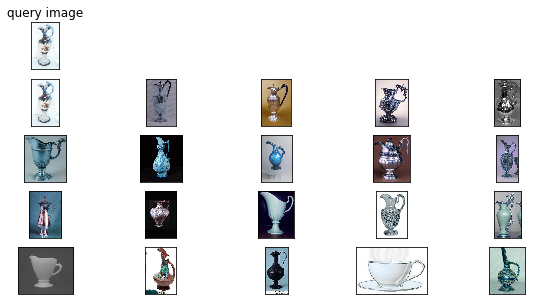

----------------------------------
101_ObjectCategories/Leopards/image_0136.jpg
results 1 | time taken : 0.2644798755645752 | accuracy: 100.0%


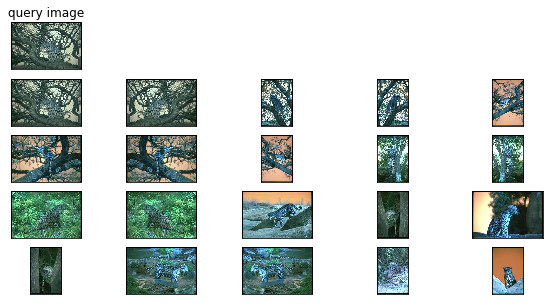

results 2 | time taken : 0.05646800994873047 | accuracy: 100.0%
percentage reduction:  78.6494 %



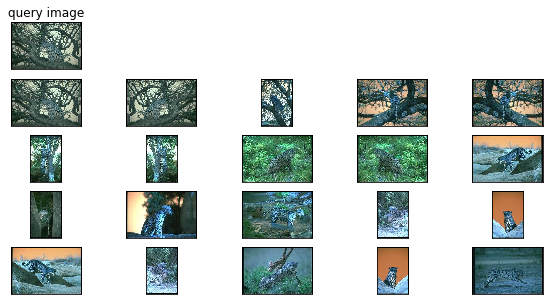

----------------------------------
101_ObjectCategories/accordion/image_0039.jpg
results 1 | time taken : 0.2638850212097168 | accuracy: 100.0%


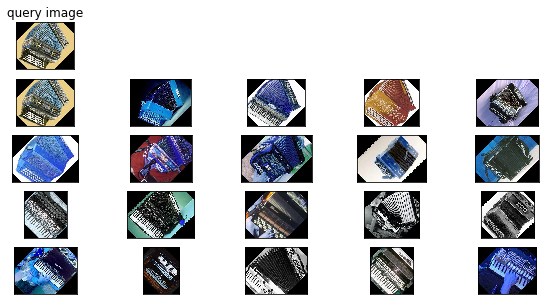

results 2 | time taken : 0.050579071044921875 | accuracy: 100.0%
percentage reduction:  80.8329 %



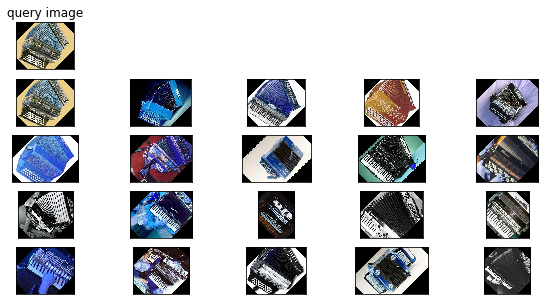

----------------------------------
101_ObjectCategories/laptop/image_0005.jpg
results 1 | time taken : 0.25812816619873047 | accuracy: 100.0%


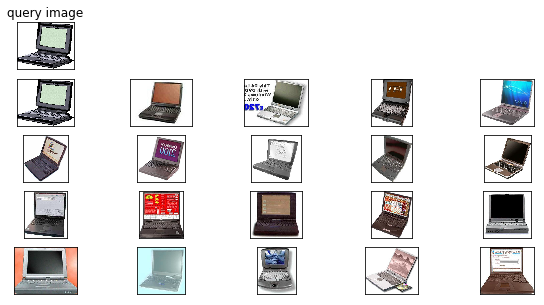

results 2 | time taken : 0.09024572372436523 | accuracy: 100.0%
percentage reduction:  65.0384 %



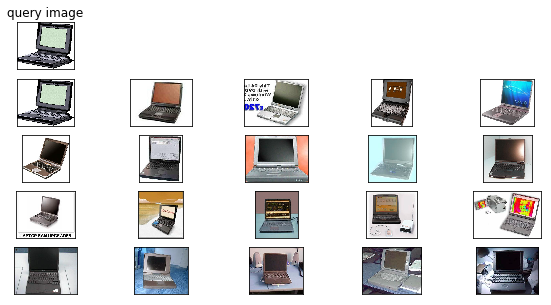

----------------------------------
101_ObjectCategories/ketch/image_0074.jpg
results 1 | time taken : 0.26960110664367676 | accuracy: 90.0%


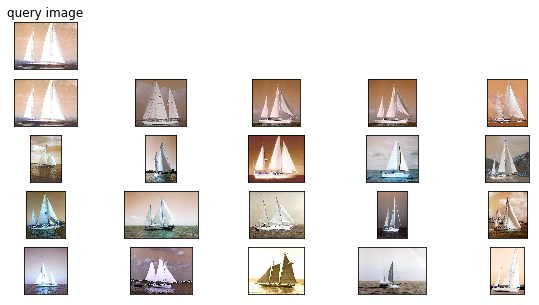

results 2 | time taken : 0.16731715202331543 | accuracy: 90.0%
percentage reduction:  37.939 %



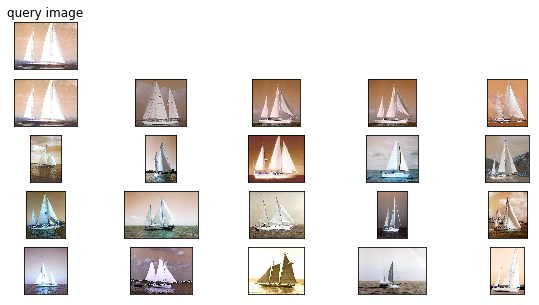

----------------------------------
101_ObjectCategories/ant/image_0017.jpg
results 1 | time taken : 0.26128411293029785 | accuracy: 5.0%


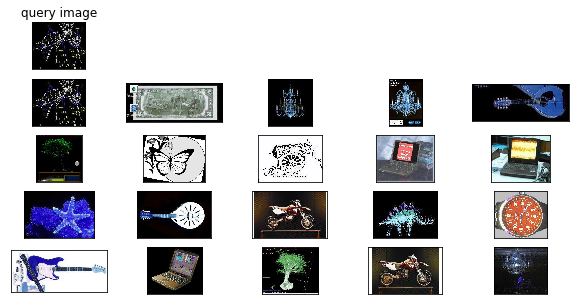

results 2 | time taken : 0.11294412612915039 | accuracy: 15.0%
percentage reduction:  56.7734 %



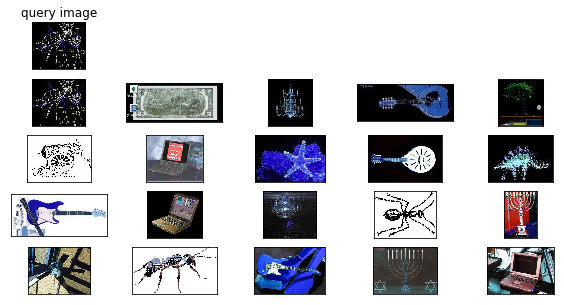

----------------------------------
101_ObjectCategories/buddha/image_0081.jpg
results 1 | time taken : 0.2740039825439453 | accuracy: 90.0%


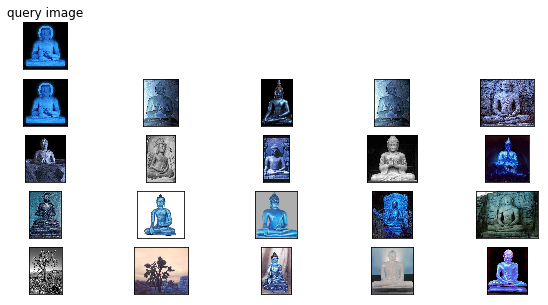

results 2 | time taken : 0.06901812553405762 | accuracy: 50.0%
percentage reduction:  74.8113 %



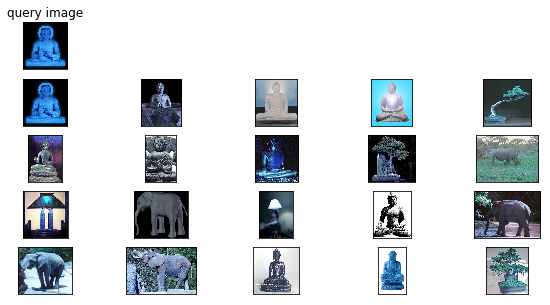

----------------------------------
101_ObjectCategories/Motorbikes/image_0741.jpg
results 1 | time taken : 0.2640089988708496 | accuracy: 100.0%


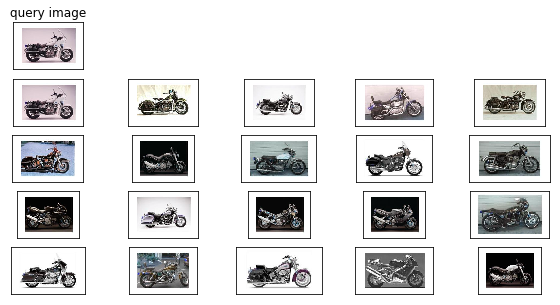

results 2 | time taken : 0.1424410343170166 | accuracy: 100.0%
percentage reduction:  46.0469 %



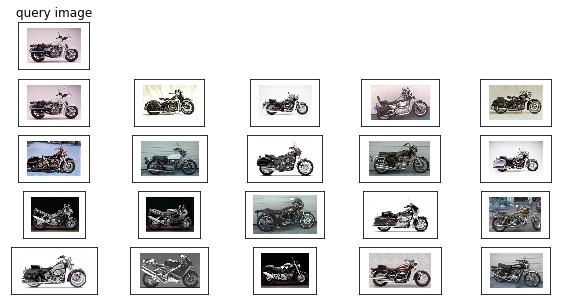

----------------------------------
101_ObjectCategories/schooner/image_0018.jpg
results 1 | time taken : 0.27447509765625 | accuracy: 85.0%


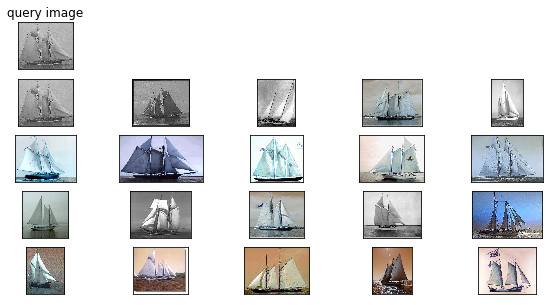

results 2 | time taken : 0.16819286346435547 | accuracy: 85.0%
percentage reduction:  38.722 %



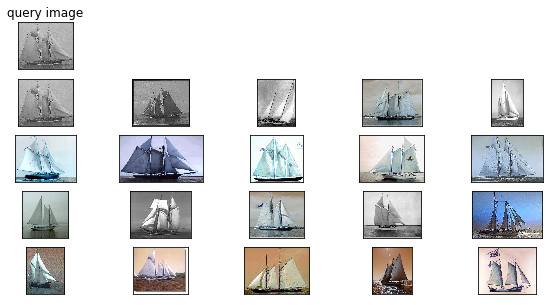

----------------------------------


/anaconda3/envs/cnn_vgg16/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/anaconda3/envs/cnn_vgg16/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in greater_equal
/anaconda3/envs/cnn_vgg16/lib/python3.6/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in less


101_ObjectCategories/lobster/image_0021.jpg
results 1 | time taken : 0.27279114723205566 | accuracy: 5.0%


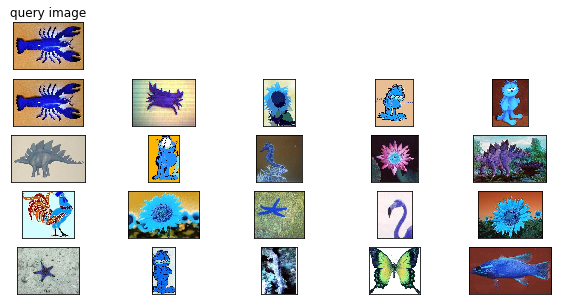

results 2 | time taken : 0.20105195045471191 | accuracy: 5.0%
percentage reduction:  26.2982 %



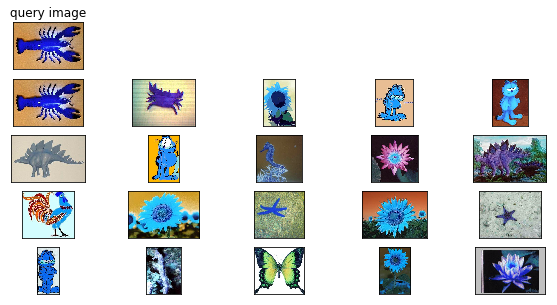

----------------------------------
101_ObjectCategories/grand_piano/image_0083.jpg
results 1 | time taken : 0.2856729030609131 | accuracy: 100.0%


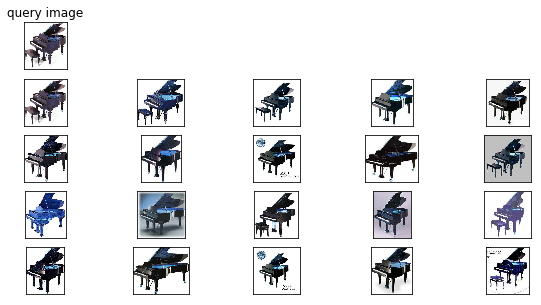

results 2 | time taken : 0.1298658847808838 | accuracy: 100.0%
percentage reduction:  54.5404 %



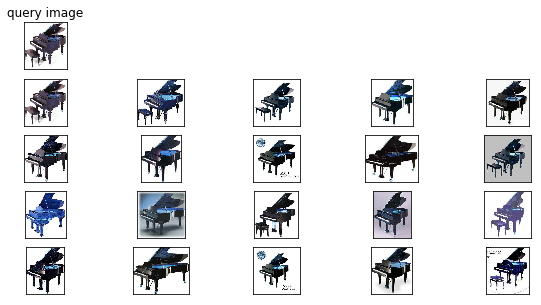

----------------------------------
101_ObjectCategories/ketch/image_0032.jpg
results 1 | time taken : 0.2812159061431885 | accuracy: 90.0%


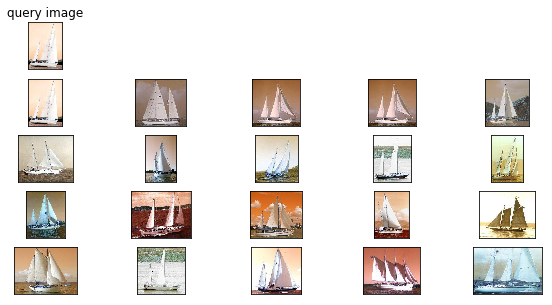

results 2 | time taken : 0.165693998336792 | accuracy: 90.0%
percentage reduction:  41.0794 %



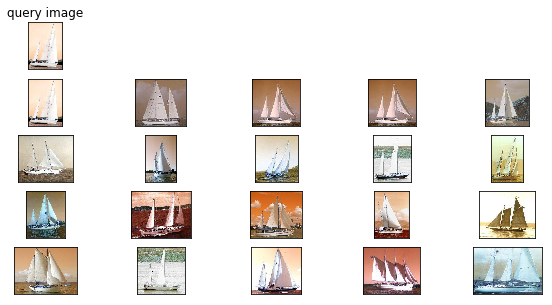

----------------------------------
101_ObjectCategories/Motorbikes/image_0166.jpg
results 1 | time taken : 0.26309990882873535 | accuracy: 100.0%


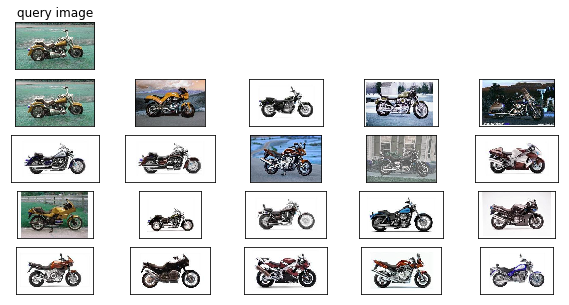

results 2 | time taken : 0.11290693283081055 | accuracy: 100.0%
percentage reduction:  57.0859 %



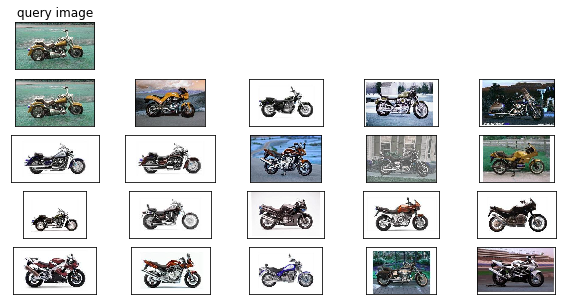

----------------------------------
101_ObjectCategories/bonsai/image_0108.jpg
results 1 | time taken : 0.36624622344970703 | accuracy: 100.0%


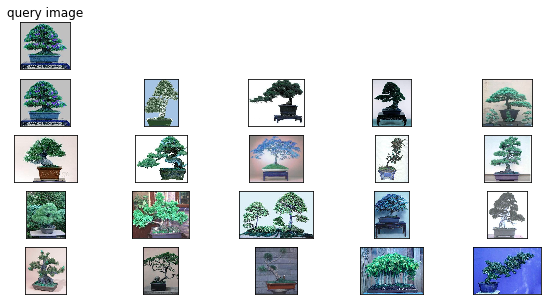

results 2 | time taken : 0.1063392162322998 | accuracy: 65.0%
percentage reduction:  70.9651 %



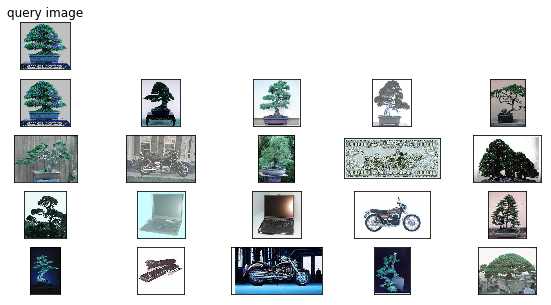

----------------------------------
101_ObjectCategories/brontosaurus/image_0020.jpg
results 1 | time taken : 0.3590559959411621 | accuracy: 15.0%


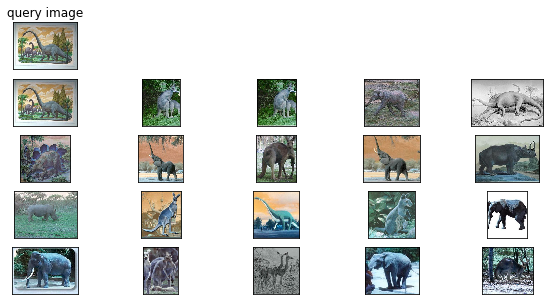

results 2 | time taken : 0.0934908390045166 | accuracy: 5.0%
percentage reduction:  73.962 %



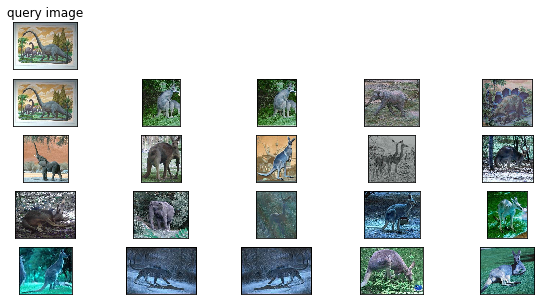

----------------------------------
101_ObjectCategories/bonsai/image_0013.jpg
results 1 | time taken : 0.28214097023010254 | accuracy: 95.0%


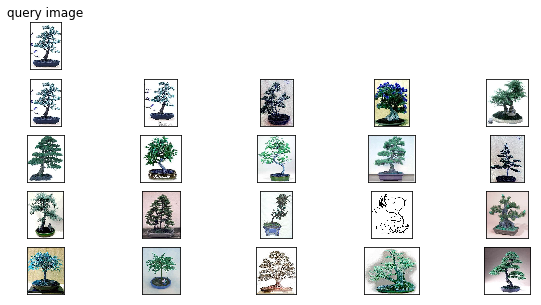

results 2 | time taken : 0.2791571617126465 | accuracy: 100.0%
percentage reduction:  1.0576 %



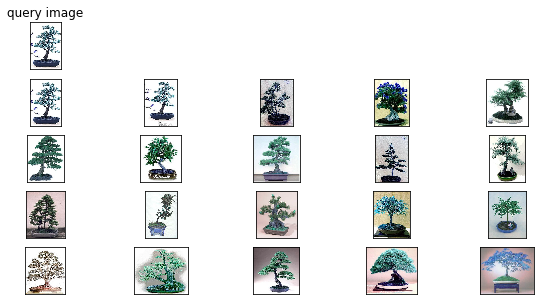

----------------------------------
101_ObjectCategories/cougar_body/image_0018.jpg
results 1 | time taken : 0.2815432548522949 | accuracy: 90.0%


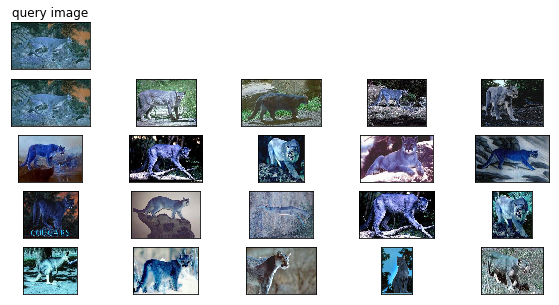

results 2 | time taken : 0.08876299858093262 | accuracy: 85.0%
percentage reduction:  68.4727 %



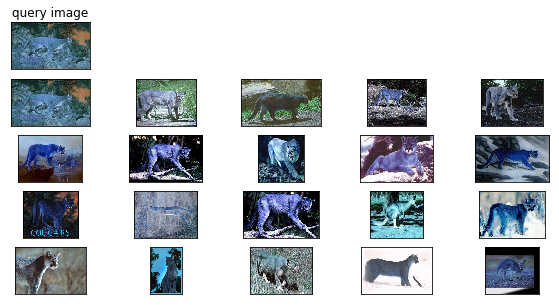

----------------------------------
101_ObjectCategories/dollar_bill/image_0036.jpg
results 1 | time taken : 0.26799488067626953 | accuracy: 100.0%


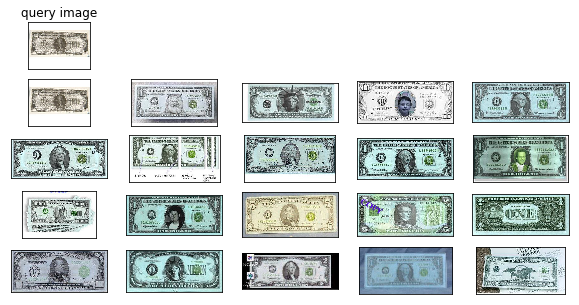

results 2 | time taken : 0.16855621337890625 | accuracy: 90.0%
percentage reduction:  37.1047 %



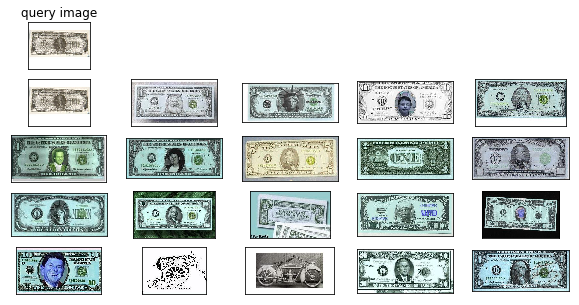

----------------------------------
101_ObjectCategories/Motorbikes/image_0042.jpg
results 1 | time taken : 0.27106714248657227 | accuracy: 100.0%


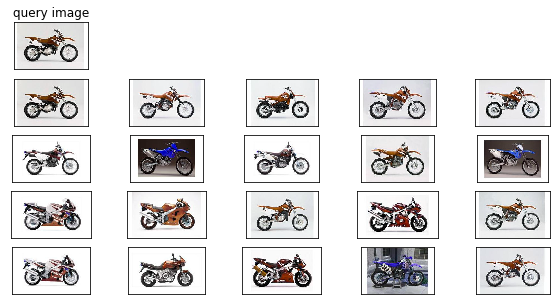

results 2 | time taken : 0.1116800308227539 | accuracy: 100.0%
percentage reduction:  58.7999 %



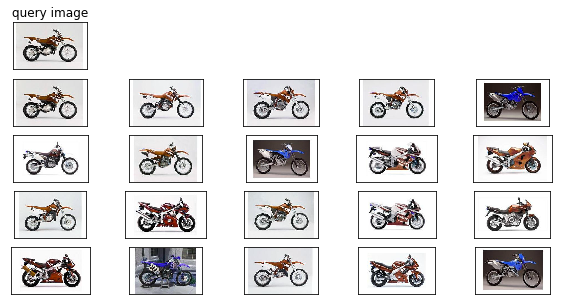

----------------------------------
101_ObjectCategories/watch/image_0127.jpg
results 1 | time taken : 0.2572791576385498 | accuracy: 100.0%


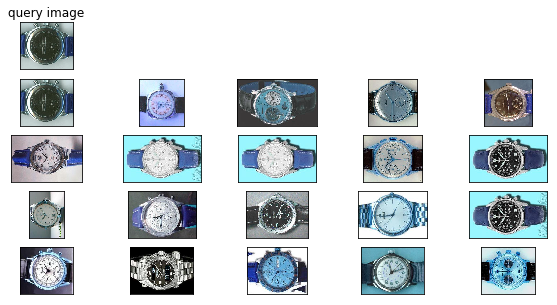

results 2 | time taken : 0.03508186340332031 | accuracy: 100.0%
percentage reduction:  86.3643 %



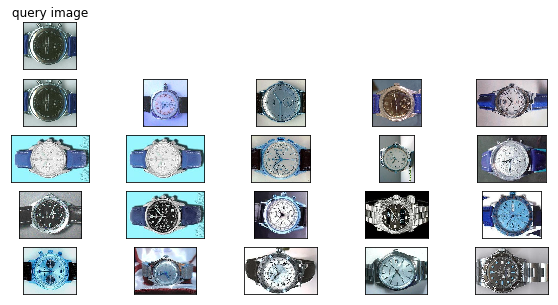

----------------------------------
101_ObjectCategories/wheelchair/image_0057.jpg
results 1 | time taken : 0.256181001663208 | accuracy: 30.0%


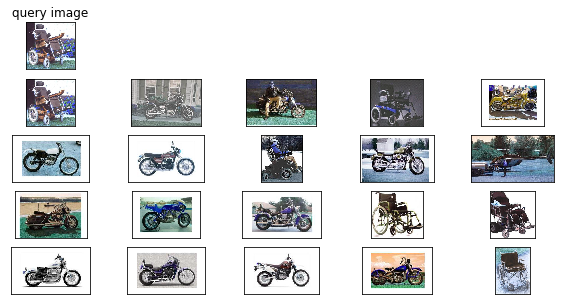

results 2 | time taken : 0.15780878067016602 | accuracy: 20.0%
percentage reduction:  38.3995 %



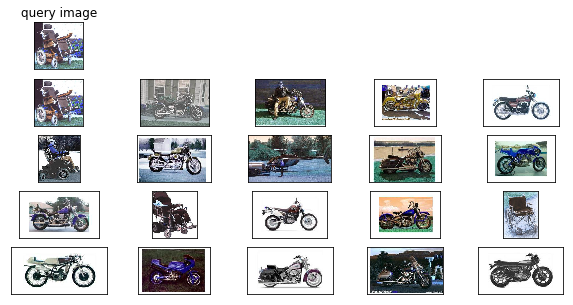

----------------------------------
101_ObjectCategories/ceiling_fan/image_0031.jpg
results 1 | time taken : 0.258350133895874 | accuracy: 70.0%


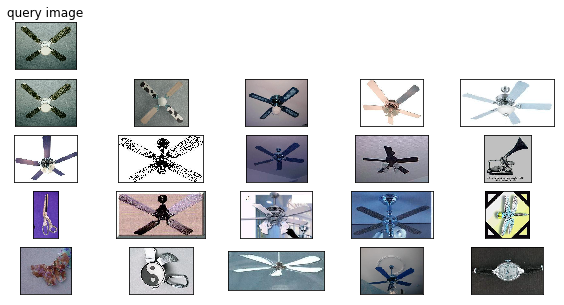

results 2 | time taken : 0.1634528636932373 | accuracy: 60.0%
percentage reduction:  36.732 %



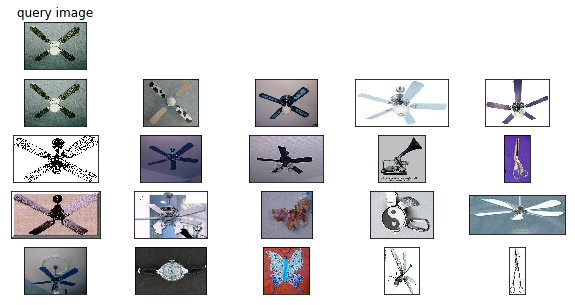

----------------------------------
101_ObjectCategories/car_side/image_0088.jpg
results 1 | time taken : 0.2846508026123047 | accuracy: 100.0%


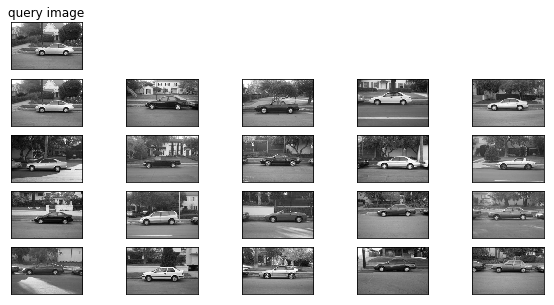

results 2 | time taken : 0.17067289352416992 | accuracy: 100.0%
percentage reduction:  40.0413 %



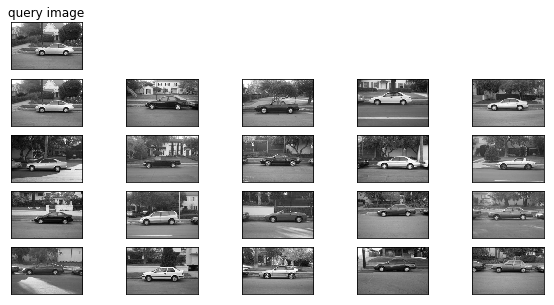

----------------------------------
101_ObjectCategories/ferry/image_0013.jpg
results 1 | time taken : 0.2867269515991211 | accuracy: 100.0%


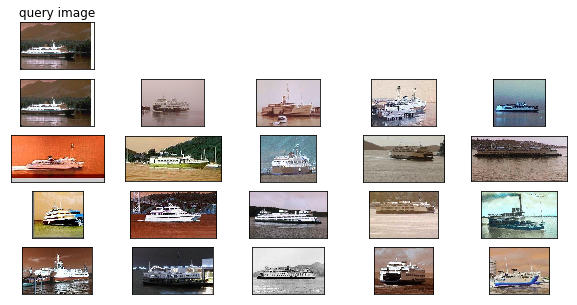

results 2 | time taken : 0.07237386703491211 | accuracy: 100.0%
percentage reduction:  74.7586 %



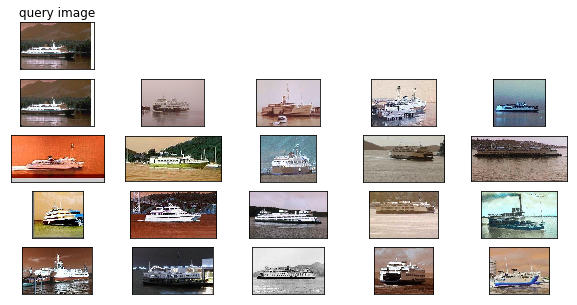

----------------------------------
101_ObjectCategories/Faces_easy/image_0120.jpg
results 1 | time taken : 0.27573394775390625 | accuracy: 65.0%


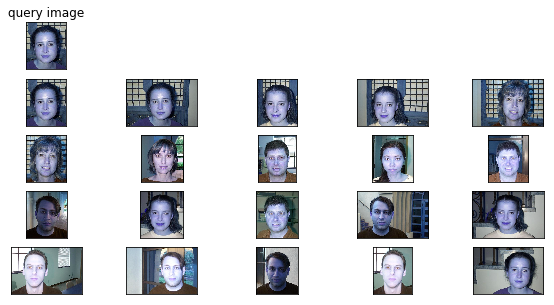

results 2 | time taken : 0.1009819507598877 | accuracy: 65.0%
percentage reduction:  63.377 %



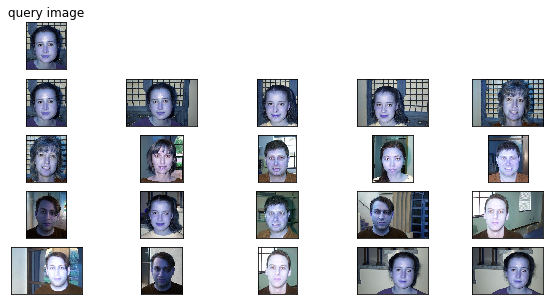

----------------------------------
101_ObjectCategories/dalmatian/image_0059.jpg
results 1 | time taken : 0.2971780300140381 | accuracy: 100.0%


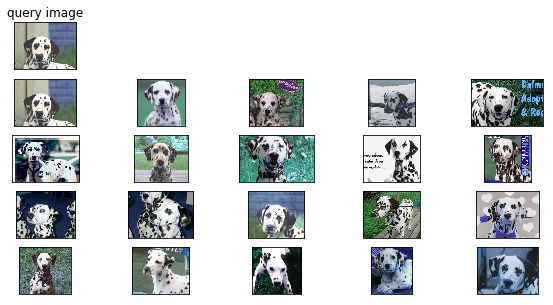

results 2 | time taken : 0.07905197143554688 | accuracy: 100.0%
percentage reduction:  73.3991 %



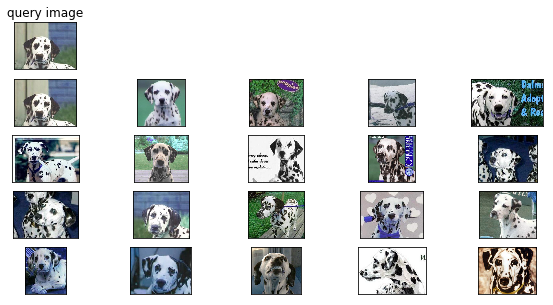

----------------------------------
101_ObjectCategories/Motorbikes/image_0263.jpg
results 1 | time taken : 0.2817502021789551 | accuracy: 100.0%


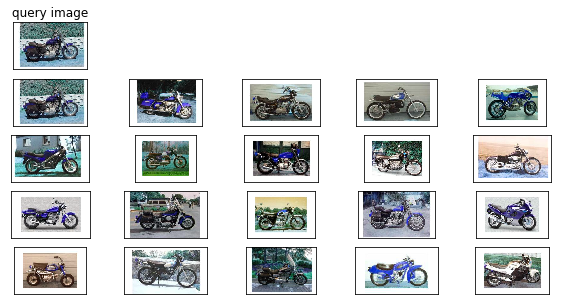

results 2 | time taken : 0.11422276496887207 | accuracy: 100.0%
percentage reduction:  59.4596 %



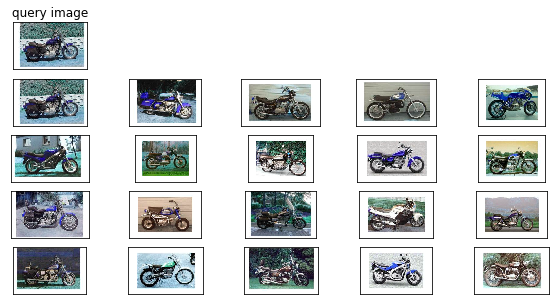

----------------------------------


In [16]:
no_queries = 40
no_retrieve = 20
hamming_distance = 2

query_img_idx = [random.randint(0,len(images_path)-1) for i in range(no_queries)]
query_images = [images_path[i] for i in query_img_idx]
                 
searcher = Searcher(index=index_fast, map_path_label=map_path_label, limit=no_retrieve)
time_results1 = []
time_results2 = []

acc_results1 = {}
acc_results2 = {}

acc_results_retrival1 = {}
acc_results_retrival2 = {}


for idx in range(no_retrieve):
    acc_results_retrival1[idx+1] = [0, 0.0]
    acc_results_retrival2[idx+1] = [0, 0.0]

    
for image_path in query_images:
    
    #print "query: %s"% image_path
    query_label = map_path_label[image_path]
    
    if query_label not in acc_results1.keys():
        acc_results1[query_label] = [0, 0.0]
        
    if query_label not in acc_results2.keys():
        acc_results2[query_label] = [0, 0.0]
    
    results1, t1, acc1 = searcher.search(image_path, use_hash = False)
    results2, t2, acc2 = searcher.search(image_path, use_hash = True, hamming_distance= hamming_distance)
    
    acc_score = 0
    for idx, item in enumerate(results1):
        item_label = map_path_label[item[2]]
        if item_label==query_label:
            acc_score += 1
        acc_results_retrival1[idx+1][1 ] += acc_score/float(idx+1)
        acc_results_retrival1[idx+1][0] += 1
        

    
    acc_score = 0
    for idx, item in enumerate(results2):
        item_label = map_path_label[item[2]]
        if item_label==query_label:
            acc_score += 1
        acc_results_retrival2[idx+1][1] += acc_score/float(idx+1)
        acc_results_retrival2[idx+1][0] += 1
        
    time_results1.append(t1)
    time_results2.append(t2)
    
    acc_results1[query_label][0] += 1
    acc_results2[query_label][0] += 1
    
    acc_results1[query_label][1] += acc1
    acc_results2[query_label][1] += acc2
    print(image_path)
    print("results 1 | time taken : {0} | accuracy: {1}%".format(t1, acc1)) 
    displayImages(image_path, results1)
    print("results 2 | time taken : {0} | accuracy: {1}%".format(t2, acc2)) 
    print("percentage reduction: ",round(100 - (t2/t1)*100,4),"%\n") 
    displayImages(image_path, results2)
    print("----------------------------------")

for k in acc_results1.keys():
    acc_results1[k] = acc_results1[k][1]/float(acc_results1[k][0])
    acc_results2[k] = acc_results2[k][1]/float(acc_results2[k][0])

for k in acc_results_retrival1.keys():
    acc_results_retrival1[k] = acc_results_retrival1[k][1]/float(acc_results_retrival1[k][0])
    acc_results_retrival2[k] = acc_results_retrival2[k][1]/float(acc_results_retrival2[k][0])

all_results = [acc_results1, acc_results2, time_results1, time_results2]
# with open('all_results_'+str(no_retrieve), 'wb') as f:
#     pickle.dump(all_results, f)
    
all_results2 = [acc_results_retrival1, acc_results_retrival2]
# with open('all_results2_'+str(no_retrieve), 'wb') as f:
#     pickle.dump(all_results2, f)

In [17]:
# with open('all_results_'+str(no_retrieve), 'rb') as f:
#     all_results = pickle.load(f)
    
# with open('all_results2_'+str(no_retrieve), 'rb') as f:
#     all_results2 = pickle.load(f)

## Results

In [18]:
# 两个变量均为dict,key从1到检索的数量，值为响应的查准率
acc_results_retrival1, acc_results_retrival2 = all_results2[0], all_results2[1]

In [19]:
import plotly.plotly as py
import plotly.graph_objs as go
keys1 = list(acc_results_retrival1.keys())
values1 = list(acc_results_retrival1.values())
keys2 = list(acc_results_retrival2.keys())
values2 = list(acc_results_retrival2.values())
print("key1", keys1)
print("values1", values1)
print("keys2", keys2)
print("values2", values2)
trace1 = go.Bar(
    x=keys1[:50],
    y=values1[:50],
    name='without hash'
)
trace2 = go.Bar(
    x=keys1[:50],
    y=values2[:50],
    name='with hash'
)
data = [trace1, trace2]

layout = go.Layout(
    title='Image Retrieval Precision on caltech101 dataset',
    xaxis=dict(
        title='20 of Top Images Retrieved ',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Precision',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-line')

key1 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
values1 [1.0, 0.8875, 0.8583333333333332, 0.85625, 0.8399999999999999, 0.8375, 0.8357142857142857, 0.8375, 0.836111111111111, 0.8324999999999999, 0.8318181818181817, 0.8291666666666666, 0.826923076923077, 0.8232142857142858, 0.8216666666666667, 0.8125, 0.8058823529411765, 0.8041666666666666, 0.805263157894737, 0.80375]
keys2 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
values2 [1.0, 0.8875, 0.8583333333333332, 0.85, 0.825, 0.825, 0.825, 0.821875, 0.8111111111111112, 0.8075000000000001, 0.809090909090909, 0.8041666666666666, 0.7961538461538462, 0.7928571428571429, 0.7916666666666667, 0.7859375, 0.7823529411764707, 0.7763888888888889, 0.7750000000000001, 0.7725]
High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~Tivcrmn/0 or inside your plot.ly account where it is named 'bar-line'


In [20]:
time_results1, time_results2 = all_results[2], all_results[3]
print(time_results1)
print(time_results2)

[0.2830188274383545, 0.26285314559936523, 0.2584359645843506, 0.2570171356201172, 0.26960086822509766, 0.2902040481567383, 0.28090500831604004, 0.27288103103637695, 0.25760412216186523, 0.26825976371765137, 0.3627142906188965, 0.3444788455963135, 0.3341031074523926, 0.2585599422454834, 0.2644798755645752, 0.2638850212097168, 0.25812816619873047, 0.26960110664367676, 0.26128411293029785, 0.2740039825439453, 0.2640089988708496, 0.27447509765625, 0.27279114723205566, 0.2856729030609131, 0.2812159061431885, 0.26309990882873535, 0.36624622344970703, 0.3590559959411621, 0.28214097023010254, 0.2815432548522949, 0.26799488067626953, 0.27106714248657227, 0.2572791576385498, 0.256181001663208, 0.258350133895874, 0.2846508026123047, 0.2867269515991211, 0.27573394775390625, 0.2971780300140381, 0.2817502021789551]
[0.15608978271484375, 0.056691884994506836, 0.08923602104187012, 0.1564619541168213, 0.16210627555847168, 0.06773185729980469, 0.12404727935791016, 0.06787991523742676, 0.0687441825866699

In [21]:
import plotly.plotly as py
import plotly.graph_objs as go

trace1 = go.Scatter(
    x=list(range(len(time_results1))),
    y=time_results1,
    name='without hash',
    mode = 'markers'
)
trace2 = go.Scatter(
    x=list(range(len(time_results2))),
    y=time_results2,
    name='with hash',
    mode = 'markers'
)
data = [trace1, trace2]

layout = go.Layout(
    title='Retrieval time analysis',
    xaxis=dict(
        title='queries ',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='time(in sec)',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='time-analysis')

In [22]:
print ("Average time reduction {0} sec".format(np.mean(time_results1) - np.mean(time_results2)))

Average time reduction 0.15938486456871032 sec
